In [9]:
import numpy as np
import aocd
import re

In [10]:
test_input = """p=0,4 v=3,-3
p=6,3 v=-1,-3
p=10,3 v=-1,2
p=2,0 v=2,-1
p=0,0 v=1,3
p=3,0 v=-2,-2
p=7,6 v=-1,-3
p=3,0 v=-1,-2
p=9,3 v=2,3
p=7,3 v=-1,2
p=2,4 v=2,-3
p=9,5 v=-3,-3"""

In [11]:
def parse_input(puzzle_input):
    lines = puzzle_input.split("\n")
    numbers = []
    for line in lines:
        parts = line.split(" ")
        rns = []
        for part in parts:
            part = part.split("=")[-1]
            rns += [int(x) for x in part.split(",")]
        numbers.append(rns)
    robots = np.array(numbers)
    positions, velocities = robots[:,:2], robots[:,2:]
    return positions, velocities

In [12]:
def predict_positions(puzzle_input, steps, h=7,w=11):
    positions, velocities = parse_input(puzzle_input)
    final_positions = (positions+(velocities*steps))%np.array([h,w])
    
    return final_positions

In [13]:
def make_map(positions, w=11, h = 7):
    m = np.zeros(shape = (h,w))
    l, c = np.unique(positions, return_counts=True, axis=0)
    for p, v in zip(l, c):
        m[p[1], p[0]] = v
    return m

In [14]:
def safety_factor(final_map):
    h,w = final_map.shape
    q1 = final_map[:h//2, :w//2]
    q2 = final_map[:h//2, w//2+1:]
    q3 = final_map[h//2+1:, :w//2]
    q4 = final_map[h//2+1:, w//2+1:]
    # for q in (q1, q2, q3, q4):
    #     print(q.shape, q.sum())
    return q1.sum()*q2.sum()*q3.sum()*q4.sum()
    

In [15]:
def solve1(puzzle_input, steps = 100, w = 11, h = 7):
    fps = predict_positions(puzzle_input, steps, w, h)
    fpm = make_map(fps, w, h)
    return(int(safety_factor(fpm)))

In [16]:
import matplotlib.pyplot as plt

In [17]:
solve1(test_input)

12

In [18]:
puzzle_input = aocd.get_data(day = 14, year = 2024)

In [19]:
sf = solve1(puzzle_input, steps = 100, w = 101, h = 103)

In [20]:
sf

228410028

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
import itertools

In [23]:

global world, positions, velocities
positions, velocities = parse_input(puzzle_input)
world = make_map(positions, 101,103)

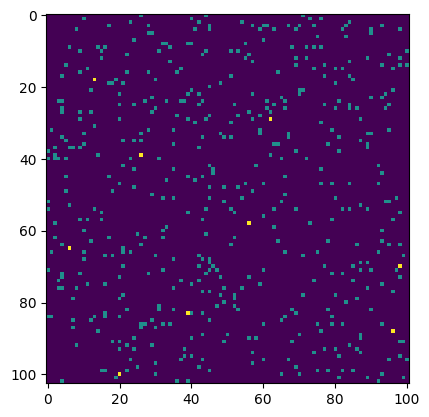

In [24]:
fig, ax  = plt.subplots()
img = ax.imshow(world)

In [25]:

def next_positions(positions, velocities, h,w):
    positions = (positions + velocities)%np.array([h,w])
    return positions

def next_world(positions, velocities, h, w):
    positions = next_positions(positions, velocities, h ,w )
    return make_map(positions, h, w), positions
    

In [26]:
positions, velocities = parse_input(puzzle_input)
world = next_world(positions, velocities, 101, 103)
world, positions = next_world(positions, velocities, 101, 103)
rows,cols = world.shape

In [27]:

fig, ax = plt.subplots(figsize = (6,6))
img = ax.imshow(np.zeros(shape = (rows, cols)), cmap = "gray")
global world


#init function for the animation returns empty world
def init_func():
    img.set_array(np.zeros(shape = (rows, cols)))
    return img,


def animate(i):
    global world, positions, velocities
    w, h = world.shape
    world, positions = next_world(positions, velocities, h, w)
    img.set_array(world)
    img.autoscale()
    return img,
    
game = animation.FuncAnimation(fig, animate, init_func = init_func, blit = True, interval = 100, frames = 500);
plt.close(game._fig);
HTML(game.to_jshtml())

In [30]:
positions, velocities = parse_input(puzzle_input)
world = next_world(positions, velocities, 101, 103)
world, positions = next_world(positions, velocities, 101, 103)

In [31]:
## This works and is how I found it, but its not pretty...

# fig, ax = plt.subplots(figsize = (5,5))
# img = ax.imshow(world > 0, cmap = "gray")
# ax.set_title(f"i")
# for i in range(1, 15000):
#     w, positions = next_world(positions, velocities, 101, 103)
#     s = safety_factor(w)
#     img.set_array(w>0)
#     fig.savefig(f"{s}_aftert_{i}_seconds.jpg")


Ok, we have used modulus of width and height... So we can have width * height cycle lenght? That feels correct...

In [32]:
cycles = 101*103

In [33]:
cycles

10403

In [34]:
#lets for every cycle length create a safety score

In [35]:
positions, velocities = parse_input(puzzle_input)

In [36]:
puzzle_input = aocd.get_data(day = 14, year = 2024)

In [116]:
positions, velocities = parse_input(puzzle_input)
# world = next_world(positions, velocities, 101, 103)
world, positions = next_world(positions, velocities, 101, 103)

In [143]:
safety_scores = []
for steps in range(1, cycles+1):
    # fp = predict_positions(puzzle_input, steps, 103, 101)
    world, positions = next_world(positions, velocities, 101, 103)
    #accumulate some potentially useful statistics
    varx = np.var(positions[:,0])
    vary = np.var(positions[:,1])
    var = np.var(positions)
    # world = make_map(fp, w=103, h=101)
    sf = safety_factor(world)
    safety_scores.append([steps, sf, world, varx, vary, var])


In [146]:
import pandas as pd

In [147]:
safety_scores_df = pd.DataFrame(data = safety_scores, columns = ["steps", "sf", "m", "varx", "vary", "var"])

In [148]:
safety_scores_df.sort_values("sf")

,steps,sf,m,varx,vary,var
8256,8257,139860000.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",313.816496,340.608256,329.715100
325,326,151479020.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",820.775596,340.608256,582.962975
4548,4549,161313867.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0,...",834.043500,340.608256,587.435439
4239,4240,162039600.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",827.734476,340.608256,586.620591
5990,5991,162803200.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",835.528684,340.608256,593.747159
...,...,...,...,...,...,...
8925,8926,240030000.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",847.333900,859.291276,853.316684
9368,9369,241624416.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",868.521900,917.455564,893.105696
1490,1491,241759452.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",868.521900,865.027756,866.787824
8156,8157,241759452.0,"[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",868.521900,869.536384,869.037791


Text(0, 0.5, 'safety score')

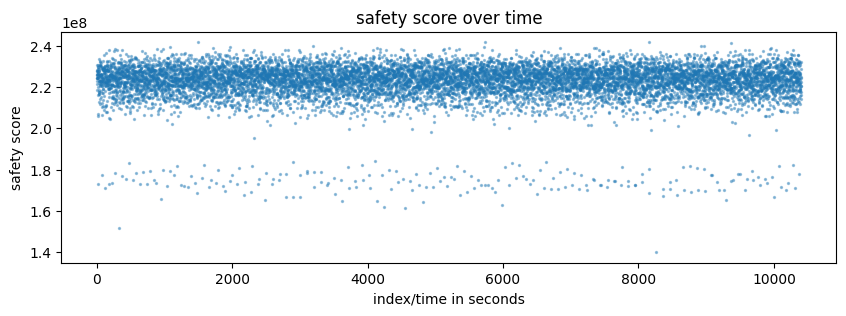

In [149]:
fig, ax = plt.subplots(figsize = (10,3))
ax.scatter(safety_scores_df.index, safety_scores_df["sf"], alpha = 0.4, s = 2)
ax.set_title("safety score over time")
ax.set_xlabel("index/time in seconds")
ax.set_ylabel("safety score")

In [140]:
sfd_sorted = safety_scores_df.sort_values("sf", ascending=True)

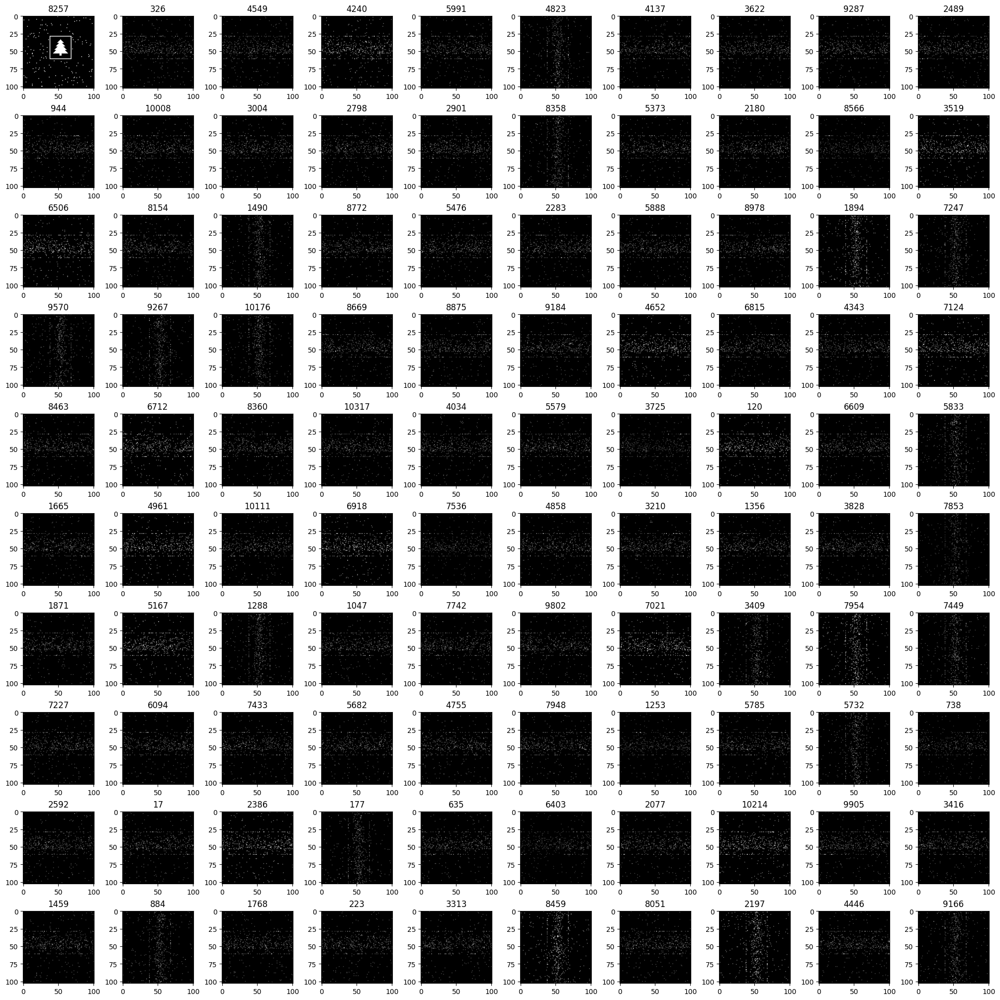

In [142]:
#plot the first 100 in case it isnt the lowes val...
fig, axes = plt.subplots(10,10, figsize = (20, 20), constrained_layout = True)
axes = axes.ravel()
cc = 0
for i, row in sfd_sorted[:len(axes)].iterrows():
    # print(row["steps"], row["ss"])
    axes[cc].imshow(row["m"], cmap = "gray")
    axes[cc].set_title(row["steps"])
    cc+=1
